## Homework 02
---
Tópicos abordados:
- Transformada de Fourier

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

### Questão 01) Classificação de Imagens borradas com a Transformada de Fourier

Crie um experimento que permita avaliar o comportamento da Transformada de Fourier em imagens com a aplicação incremental de filtros Gaussianos. Para isso, use uma imagem de referência, crie uma lista de imagens borradas e suas respectivas Transformadas de Fourier. Analise a concentração da Potência do sinal na parte central da Transformada à medida que o desvio padrão do filtro Gaussiano aumenta. Em imagens borradas, a maior parte da potência do sinal está relacionada à componentes de menor frequência do sinal. Desse modo, é possível estabelecer uma relação entre a Potência das extremidades da imagem em relação à Potência total da imagem.

A imagem `gray` será a imagem de referência deste exercício. Faça testes com outras imagens para verificar o comportamento. Atente-se às instruções de cada bloco de código dado.

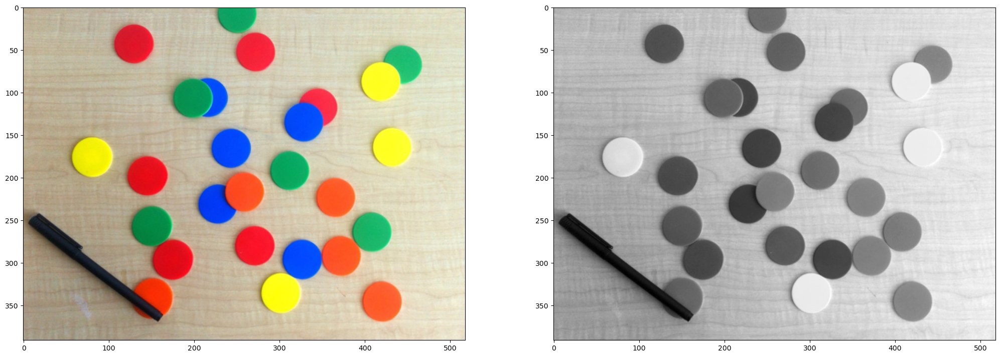

In [40]:
#fname = "images/lena.ppm"
fname = "images/coloredChips.png"

rgb = cv.cvtColor(cv.imread( fname ), cv.COLOR_BGR2RGB)
gray = cv.cvtColor(rgb, cv.COLOR_RGB2GRAY)

fig_imref = plt.figure( figsize=(25,15) )
plt.subplot(121)
plt.imshow(rgb)
plt.subplot(122)
plt.imshow(gray, cmap="gray")

**a)** Apresente uma visualização do Espectro da Magnitude e da Fase, resultante da Transformada de Fourier, para uma sequência de filtros Gaussianos aplicados na imagem de referência. A visualização deve iniciar com a imagem original, em seguida, a aplicação de filtros gaussianos com $\sigma=0,0.5,1,1.5,...,5$. O tamanho do filtro Gaussiano deve ter a dimensão de no mínimo ($\sigma*2.5+1) \times (\sigma*2.5+1$) para uma melhor aproximação da função Gaussiana.

A Transformada de Fourier pode ser calculada usando a função `np.fft.fft2` da biblioteca `numpy`. Como resultado, a Transformada retorna uma imagem de mesma dimensão no domínio dos números complexos, sendo assim, há uma *amplitude* e uma *fase* relacionada a cada ponto da imagem transformada. Por padrão, a função `fft2` cria uma imagem espelhada, sendo necessário aplicar um ajuste de espelhamento dado pelo próprio pacote da biblioteca `numpy`, o `np.fft.fftshift`.

Atenção:
- Antes de calcular a Transformada de Fourier, normalize a imagem para o intervalo [-1,1];
- A amplitude das componentes de alta frequência tendem a ser muito inferiores às de menor frequência. Assim, para visualizar o Espectro da Magnitude, é comum apresentar o log da amplitude: `plt.imshow( np.log(Mag) )`

In [41]:
def imnormalize( s, minval, maxval):
	menor = np.min(s)
	maior = np.max(s)
	return (s-menor)/(maior-menor) * (maxval-minval) + minval

sigma_step = .5
sigma_max = 5
sigma_range = np.linspace( 0, sigma_max,int(sigma_max/sigma_step)+1 )
n_sigmas = len(sigma_range)
print("Quantidade de filtros: " + str(n_sigmas) )
print(sigma_range)

Quantidade de filtros: 11
[0.  0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]


In [42]:
def kernel(sigma):
    '''
    Criando o tamanho do kernel.
    Deve ser positivo e ímpar.
    '''
    k = int(sigma*2.5+1)
    if k%2 == 0:
        k=k+1
    return k

Text(0.5, 0.9, 'Blurring and fourier transform applied')

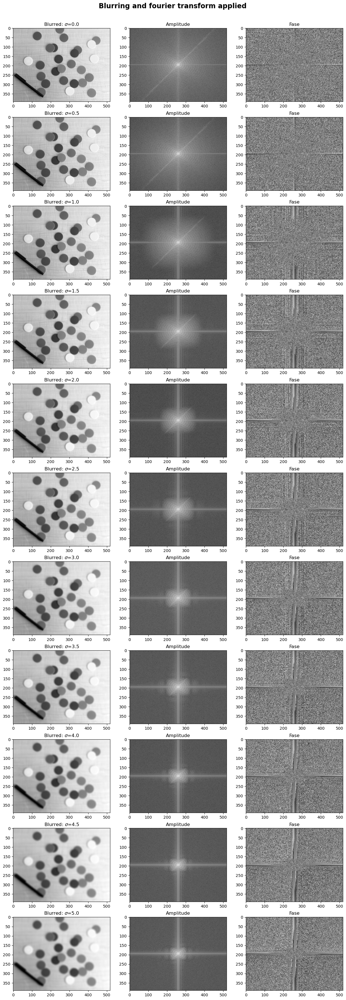

In [43]:
fig, ax = plt.subplots(11, 3, figsize=(15,n_sigmas*4))
i=0
fft_mags = list()

##### Put your code here #####
for sigma in sigma_range:
	ksize = kernel(sigma)

	#passando o filtro gaussiano
	gray_gauss = cv.GaussianBlur(gray, (ksize,ksize), sigmaX=sigma)
	gray_gauss = gray_gauss.astype(np.uint8)
	ax[i,0].imshow(gray_gauss,cmap='gray')
	ax[i,0].set_title(f'Blurred: $\sigma$={sigma}')

	#aplicando a fft
	gray_fft = imnormalize(gray_gauss, -1, 1)
	gray_fft = np.fft.fft2(gray_fft)
	gray_fft = np.fft.fftshift(gray_fft)

	#amplitude da fft
	gray_fft_abs = np.abs(gray_fft)
	ax[i,1].imshow(np.log(gray_fft_abs),cmap='gray')
	ax[i,1].set_title(f'Amplitude')
	fft_mags.append(np.log10(gray_fft_abs))

	#fase da fft
	gray_fft_phase = np.angle(gray_fft, deg=True)
	ax[i,2].imshow(gray_fft_phase,cmap='gray')
	ax[i,2].set_title(f'Fase')

	i+=1
plt.suptitle('Blurring and fourier transform applied', size='xx-large', weight='bold', y=0.9)

*`Bonus`*   **b)**    Crie uma lista de máscaras que permitam selecionar, das extremidades para o centro, uma parcela controlada da área de toda imagem. A área varia de 100% para 0% com passos de 5%. Assim, cada máscara representa uma seleção de uma faixa de alta frequência.

[0.   0.05 0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65
 0.7  0.75 0.8  0.85 0.9  0.95 1.  ]


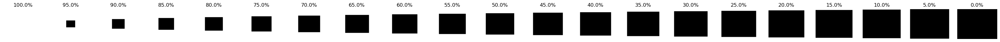

In [44]:
def mask_builder(shape, k, inv=0 ) :
	if inv :
		M = np.ones( shape )
	else :
		M = np.zeros( shape )
	
	f = (1-np.sqrt(k))/2
	idx = (np.floor( np.array(shape) * f)).astype(int)
	M[ idx[0]:shape[0]-idx[0], idx[1]:shape[1]-idx[1] ] = 1-inv
	return M


## Building the mask list
step = .05
nmasks = np.floor(1/step+1).astype(int)
masks = list()
r = np.linspace(0,1,nmasks)
print(r)
for i in r :
	masks.append( mask_builder(gray.shape, i, 1 ) )

## Show all masks in the list. The white color indicates the selected region
fig = plt.figure( figsize=(nmasks*2,nmasks*2))
c = 1
for m in masks:
	plt.subplot(1, nmasks, c)
	plt.axis('off')
	plt.title( "{:.1f}%".format( (1-r[c-1])*100 ) )
	plt.imshow(m, vmin=0, vmax=1, cmap='gray')
	c=c+1

**c)** Apresente um gráfico que relaciona as Áreas de alta frequência selecionadas pelas máscaras da questão anterior com a proporção da Potência da Magnitude do sinal da imagem das imagens borradas. Trace um gráfico para cada filtro Gaussiano utilizado. O gráfico deve possuir a seguinte configuração: **Área de alta frequência(%)** **x** **Relação de potência** para cada $\sigma$.

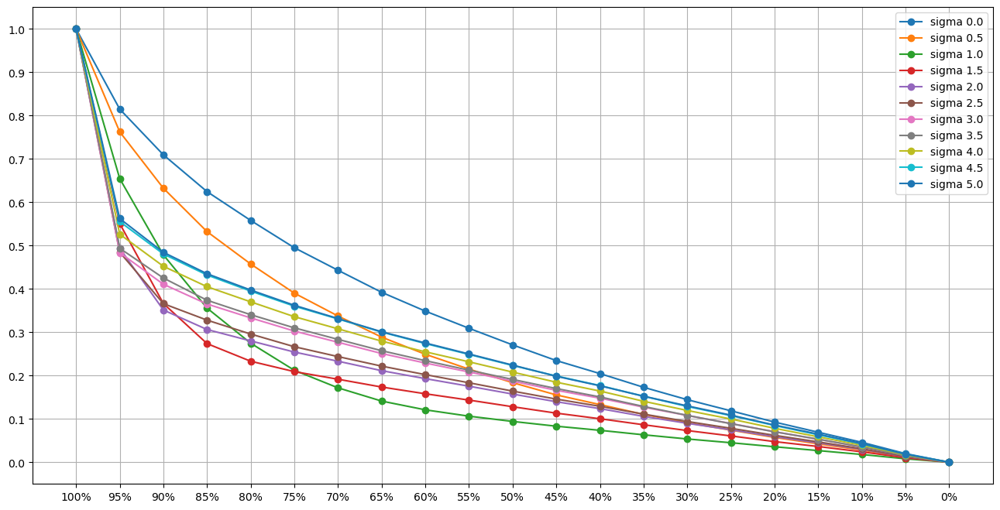

In [45]:
# Function to compute the signal power
def power( s ) :
	P = np.sum(s**2)/s.size
	return P

# Compute the power proportion of the masked area
def analysis( mags, masks ) :
	A = np.zeros((len(mags), len(masks)))
	r = 0
	c = 0
	
	for mag in mags :
		c = 0
		pwr_ref = power(mag)

		for mask in masks :
			pw = power( mag*mask )
			A[r,c] = pw/pwr_ref
			c=c+1
		r=r+1
	return A
	
A = analysis(fft_mags, masks)

plt.figure(figsize=(16,8))
plt.plot(A.T, '-o')
plt.legend( ["sigma {:.1f}".format(i) for i in sigma_range] )
xtick_labels = [ "{:.0f}%".format((1-i)*100) for i in r ]
plt.xticks( range(0,len(masks),1), xtick_labels )
plt.yticks( np.linspace(0,1,11) )
plt.grid()

**d)** A partir da análise do gráfico gerado, crie uma regra matemática entre a proporção de potência e a área de alta frequência da imagem que permita classificar uma imagem como borrada e não borrada. Apresente as métricas e o resultado da classificação no título das imagens seguintes.

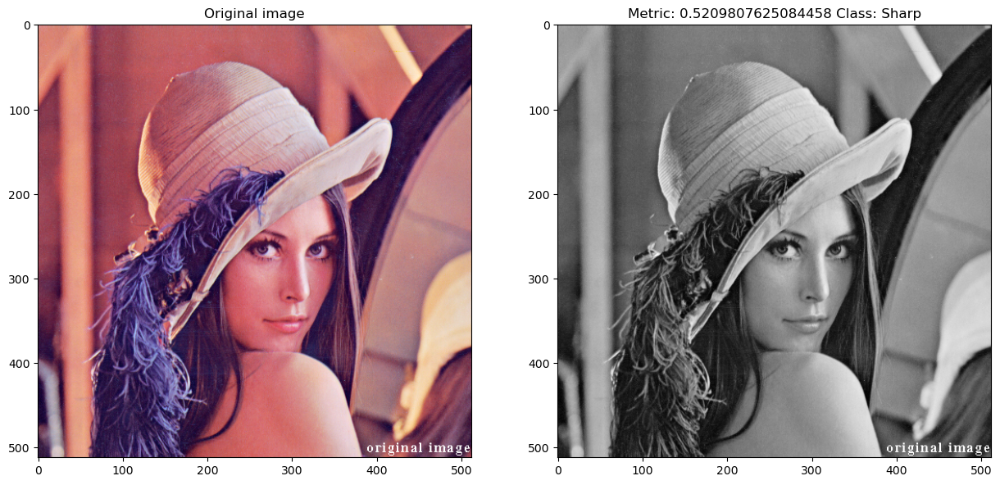

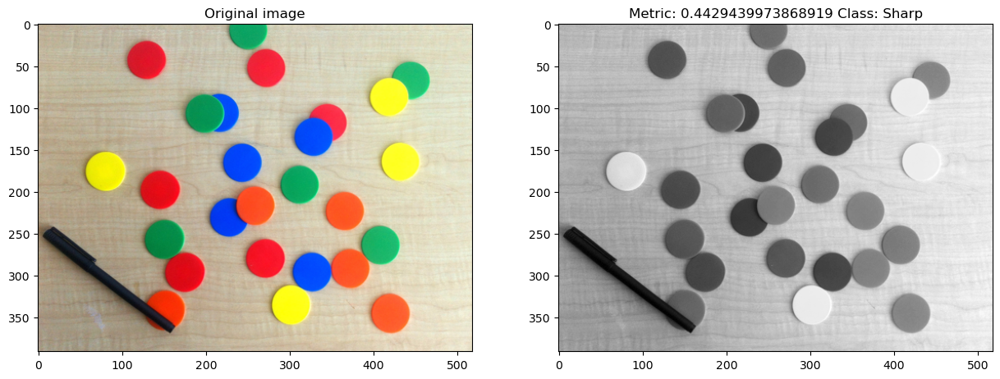

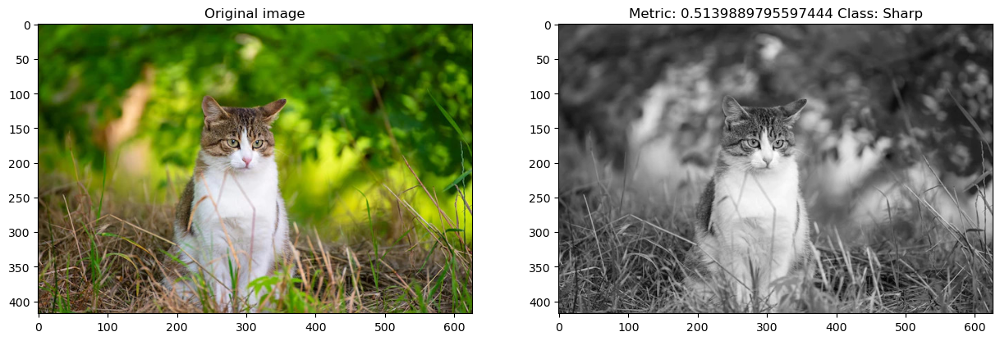

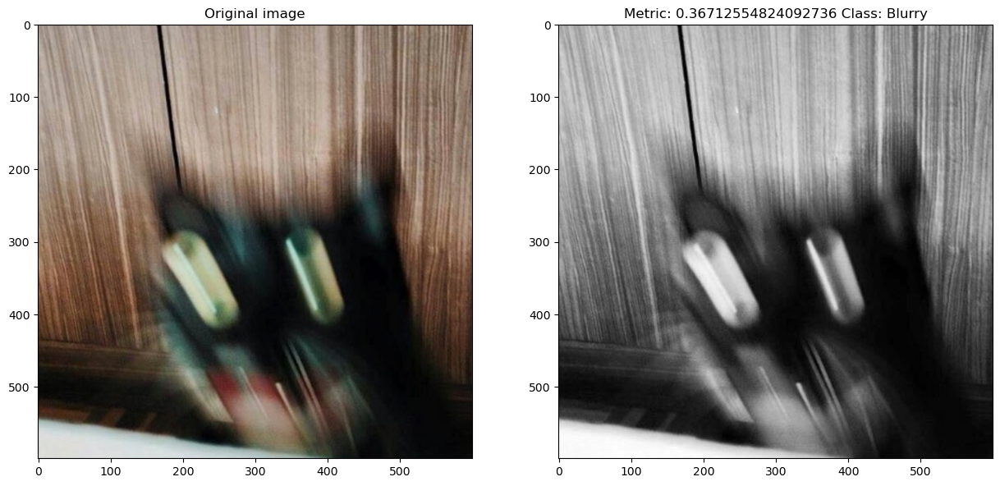

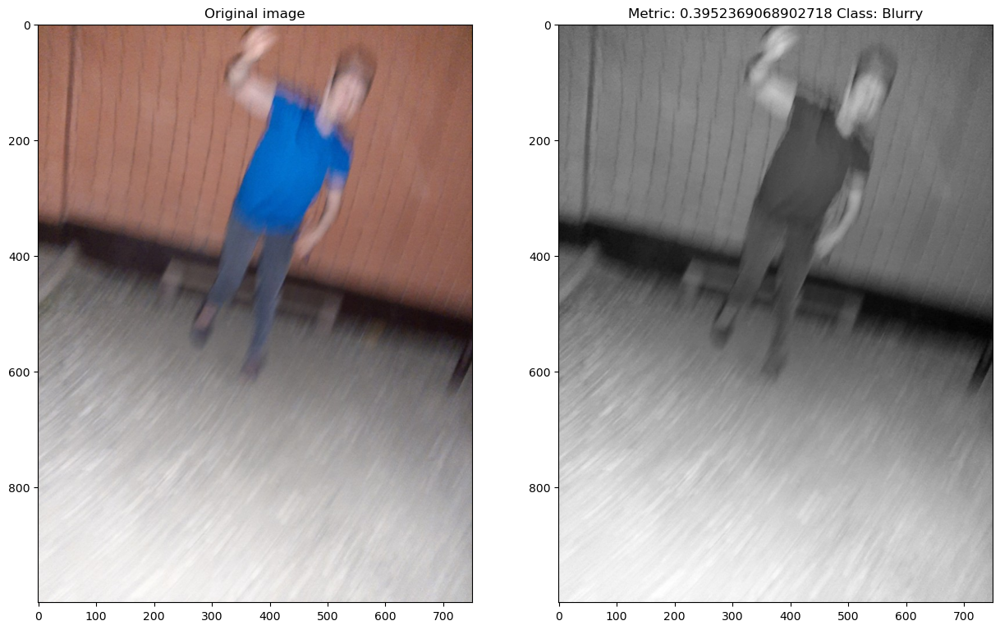

In [66]:
img_paths = "images/lena.ppm", "images/coloredChips.png",  "images/cat1.jpg", "images/cat2.jpg", "images/img3.jpg"
im_class = "sharp", "sharp", "sharp", "blurry", "blurry"

for fname in img_paths :
	rgb = cv.cvtColor(cv.imread( fname ), cv.COLOR_BGR2RGB)
	gray = cv.cvtColor(rgb, cv.COLOR_RGB2GRAY)
	fig_imref = plt.figure( figsize=(15,10) )

	plt.subplot(121)
	plt.imshow(rgb)
	plt.title("Original image")
	
	plt.subplot(122)
	plt.imshow(gray, cmap="gray")

	# Create a math relation or a metric with a specific threshold
	
	####### Put your code here! #########

	mask_80 = mask_builder(gray.shape, 0.3, 1)

	gray_fft = imnormalize(gray, -1, 1)
	gray_fft = np.fft.fft2(gray_fft)
	gray_fft = np.fft.fftshift(gray_fft)
	gray_fft_abs = np.log10(np.abs(gray_fft))

	pwr_ref = power(gray_fft_abs)
	pw = power(gray_fft_abs*mask_80)
	
	metric_val = pw/pwr_ref
	th = 0.4

	if metric_val <= th:
		im_class = "Blurry"
	else:
		im_class = "Sharp"

	plt.title("Metric: " + str(metric_val) + " Class: " + str(im_class))